## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## Code Section:
The Code is constructed using 4-Classes:
- Class `Camera`: This includes Calibration, undistortion section
- Class `Image` : This includes all Filtering Thresholds: white_threshold, sobel_treshold, hls_threshold, ...
The Class takes an Image with Instancing - and create Gray/HLS Copy
An Instance should be created for every Image/Frame while processing Video
- Class `search_window` : Search Window approach based on applying a convolution-filter, which will maximize the number of "hot" pixels in each window. The Code is based on Lesson-9: Section-6 from Lectures
- Class `Lane`: Lane Class performs:
    - polynomial line fitting of the current-detected right/left lane points
    - Buffer the Coefficents of the right/left polynomial
    - Apply **Sanity Check** of current-detected right/left lane polynomial coefficients:
        - current detected Left/Right should have the same slope sign
        - current detected Left/Right slopes should have +/-3 difference from the mean of the last saved n-Iterations
    - Calculate Road-Radius
    - Calculate Lane-Center Position Offset

In [8]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
%matplotlib inline


###########################################################################
# Configuration
###########################################################################
plt.rcParams["figure.figsize"] = [16,9]


###########################################################################
# Helper-Functions
###########################################################################
# add-subplot 
def subplot_img(fig, img, col_max, col_idx, title):
    # suplot-parameters index nrow, ncolumns, index
    a = fig.add_subplot(1, col_max, col_idx)
    img_plot = plt.imshow(img)
    # set Ttile of subplot
    a.set_title(title)
    return a

# add-subplot 
def subplot_data(fig, data, col_max, col_idx, title):
    # suplot-parameters index nrow, ncolumns, index
    a = fig.add_subplot(1, col_max, col_idx)
    m_plot = plt.plot(data)
    # set Ttile of subplot
    a.set_title(title)
    return a


###########################################################################
# Classes
###########################################################################
class Camera():
    # 
    def __init__(self):
        # Inital-Camera Values
        self.mtx =[]
        #distortion coefficients
        self.dist=[]
        # rotation vector
        self.rvecs=[]
        # translation vector
        self.tvecs=[]
    
    
    #images_folder_name = 'camera_cal/calibration*.jpg'
    #size = (9,6)
    def calibrateByChessboard(self, images_folder_name, size, draw_corners = True):
        # initialize variables
        col_max = 2
        
        # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
        objp = np.zeros((size[0]*size[1],3), np.float32)
        objp[:,:2] = np.mgrid[0:size[0],0:size[1]].T.reshape(-1,2)

        # Arrays to store object points and image points from all the images.
        objpoints = [] # 3d points in real world space
        imgpoints = [] # 2d points in image plane.

        # Make a list of calibration images
        images = glob.glob(images_folder_name)
        # Step through the list and search for chessboard corners
        for fname in images:
            img = cv2.imread(fname)
            gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
            
                
            # Find the chessboard corners
            ret, corners = cv2.findChessboardCorners(gray, size,None)

            # If found, add object points, image points
            if ret == True:
                objpoints.append(objp)
                imgpoints.append(corners)

                # Draw and display the corners
                if draw_corners == True:
                    # define new figure
                    fig = plt.figure()
                    subplot_img(fig, img, col_max, 1, "original")
                    img_mod = cv2.drawChessboardCorners(img, size, corners, ret)
                    subplot_img(fig, img, col_max, 2, "Corners")
            else:
                print("No Corners have been found for:" + fname)
        
        # Check that object points, image points are not empty
        if(len(objpoints) > 0) and (len(imgpoints) > 0):
            # Use cv2.calibrateCamera() and cv2.undistort()
            ret, self.mtx, self.dist, self.rvecs, self.tvecs = \
            cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],None,None)
        
        # return mtx/dist to be used in undistort Images
        return ret, self.mtx, self.dist
    
    
    # returns the undistorted image
    def undistort(self,img):
        if(len(self.mtx) > 0) and (len(self.dist)>0):
            undist = cv2.undistort(img, self.mtx, self.dist, None, self.mtx)
        else:
            undist = img
        return undist

'''
Image Class includes all Filtering Thresholds: white_threshold, sobel_treshold, hls_threshold, ...
The Class takes an Image with Instancing - and create Gray/HLS Copy
An Instance should be created for every Image/Frame while processing Videos
'''
class Image():
    
    def __init__(self, img, interact_plot=False, show_plot=False):
        # Save-Image Structure
        self.img = img
        
        # Plot-Configuration:
        # --------------------------------------
        # Save Plot-Configuration for Test-Images
        self.show_plot = show_plot
        # Save Interact Configuration for Testing Thresholds directly on Jupyter
        self.interact_plot = interact_plot
        
        # Create Image Copies:
        # --------------------------------------
        #Convert to Gray
        self.gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
        #convert to hls-image
        self.hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        
    def white_thresh(self, w_thresh_min= 200, w_thresh_max = 255):
        # Apply White-color-mask
        mask_white = cv2.inRange(self.gray, w_thresh_min, w_thresh_max)
        white_image = cv2.bitwise_and(self.gray, mask_white)
        
        # Create a binary image of ones where threshold is met, zeros otherwise
        white_binary = np.zeros_like(white_image)
        white_binary[(white_image >= w_thresh_min) & (white_image <= w_thresh_max)] = 1
        
        # check if Interaction-Plot Flag is enabled
        if self.interact_plot == True:
            plt.imshow(white_binary)
            plt.show()
    
        return white_binary

    # img should be gray-image
    def abs_sobel_thresh(self, sobel_kernel=3, thresh_min=20, thresh_max=100):
        # Calculate directional gradient
        # Sobel x
        sobelx = cv2.Sobel(self.gray, cv2.CV_64F, 1, 0) # Take the derivative in x
        abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
        scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

        # Create a binary image of ones where threshold is met, zeros otherwise
        sxbinary = np.zeros_like(scaled_sobel)
        sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
        
        # check if Interaction-Plot Flag is enabled
        if self.interact_plot == True:
            plt.imshow(sxbinary)
            plt.show()
        
        return sxbinary

    def mag_thresh(self, sobel_kernel=3, m_thresh_min= 0, m_thresh_max= 255):
        # Calculate gradient magnitude
        # Take both Sobel x and y gradients
        sobelx = cv2.Sobel(self.gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
        sobely = cv2.Sobel(self.gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
        # Calculate the gradient magnitude
        gradmag = np.sqrt(sobelx**2 + sobely**2)
        # Rescale to 8 bit
        scale_factor = np.max(gradmag)/255 
        gradmag = (gradmag/scale_factor).astype(np.uint8) 
        # Create a binary image of ones where threshold is met, zeros otherwise
        mag_binary = np.zeros_like(gradmag)
        mag_binary[(gradmag >= m_thresh_min) & (gradmag <= m_thresh_max)] = 1
        
        # check if Interaction-Plot Flag is enabled
        if self.interact_plot == True:
            plt.imshow(mag_binary)
            plt.show()
            
        # Apply threshold
        return mag_binary

    def dir_threshold(self, sobel_kernel=3, thresh=(0, np.pi/2)):
        # Calculate gradient direction
        # Apply threshold
        dir_binary = []
        return dir_binary
    
    # TODO: apply s_thresh_min = 170, s_thresh_max = 255
    def hls_threshold(self, s_thresh_min=170, s_thresh_max = 255):
        #Apply HLS-Threshold on HLS-Copy (self.hls)
        
        #extract s-Channel
        s_channel = self.hls[:,:,0]

        # Create a binary image of ones where threshold is met, zeros otherwise
        s_binary = np.zeros_like(s_channel)
        s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1

        # check if Interaction-Plot Flag is enabled
        if self.interact_plot == True:
            plt.imshow(s_binary)
            plt.show()
            
        return s_binary
    
    def rgb_threshold(self, r_thresh_min = 200, r_thresh_max= 255):

        #extract r-Channel
        r_channel = self.img[:,:,2]

        ## Create a binary image of ones where threshold is met, zeros otherwise
        r_binary = np.zeros_like(r_channel)
        r_binary[(r_channel >= r_thresh_min) & (r_channel <= r_thresh_max)] = 1

        # check if Interaction-Plot Flag is enabled
        if self.interact_plot == True:
            plt.imshow(r_binary)
            plt.show()
            
        return r_binary
    
    def region_of_interest(self, img, vertices):
        """
        Applies an image mask.

        Only keeps the region of the image defined by the polygon
        formed from `vertices`. The rest of the image is set to black.
        `vertices` should be a numpy array of integer points.
        """
        # Save Vertices of ROI
        self.vertices = vertices
        
        #defining a blank mask to start with
        mask = np.zeros_like(img)   

        #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
        if len(img.shape) > 2:
            channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
            ignore_mask_color = (255,) * channel_count
        else:
            ignore_mask_color = 255

        #filling pixels inside the polygon defined by "vertices" with the fill color    
        cv2.fillPoly(mask, np.int_([vertices]), ignore_mask_color)

        #returning the image only where mask pixels are nonzero
        masked_image = cv2.bitwise_and(img, mask)
        return masked_image
    
    def hist(self, img):
        # Grab only the bottom half of the image
        # Lane lines are likely to be mostly vertical nearest to the car
        bottom_half = img[img.shape[0]//2:,:]

        # Sum across image pixels vertically - make sure to set an `axis`
        # i.e. the highest areas of vertical lines should be larger values
        histogram = np.sum(bottom_half, axis=0)

        return histogram

    # Warp Image - based on Src-Points, Dst-Points
    def warp(self, img, src, dst):
        
        # extract Image-Size - Image to be warped
        img_size = (img.shape[1], img.shape[0])

        # use cv2.getPerspectiveTransform() to get M, the transform matrix, and Minv, the inverse
        M = cv2.getPerspectiveTransform(src, dst)
        Minv = cv2.getPerspectiveTransform(dst, src)
        
        # use cv2.warpPerspective() to warp your image to a top-down view
        warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
        
        return warped, M, Minv
    
    # unWarp Image - based on saved MINV
    def unwarp(self, img, Minv):
        
        # get size of warped image
        img_size = (img.shape[1], img.shape[0])
        
        # use cv2.warpPerspective() to warp your image to a top-down view
        un_warp_img = cv2.warpPerspective(img, Minv, img_size, flags=cv2.INTER_LINEAR)
        
        # Combine the result with the original image
        new_img = np.copy(self.img)
        un_warp_img = cv2.addWeighted(new_img, 1, un_warp_img, 0.3, 0)
        
        return un_warp_img
    
    # Calculate Warp-Points
    # The Values are constants - derived from Testing the Warping in Test-Warp-Sections
    # TODO: The function should be kept generic
    def calc_warp_points(self, x_center_adj=0):    
        
        '''
        # calculator the vertices of the region of interest
        imshape = self.img.shape
        xcenter=imshape[1]/2+x_center_adj
        #     xfd=55
        #     yf=450
        #     xoffset=100
        xfd=54
        yf=imshape[0]/2
        xoffset=100

        src = np.float32(
            [(xoffset,imshape[0]),
             (xcenter-xfd, yf), 
             (xcenter+xfd,yf), 
             (imshape[1]-xoffset,imshape[0])])

        
        dst = np.float32(
            [(xcenter - 2*xoffset,imshape[0]),
             (xcenter - 2*xoffset,0),
             (xcenter + 2*xoffset, 0),
             (xcenter + 2*xoffset,imshape[1])])

        '''
        # let us assume that vertices represent rectangle in real-world
        src = np.float32([[150, 720],[560, 450] ,[720, 450] , [1180, 720]])
        dst = np.float32([[350, 720],[210, 0], [1010, 0],[870,720]])

        return src, dst
    
    # Draw Lane Lines - on Warped Image
    # The function takes left/right Points and draw the Lane-Lines (Polylines) on Copied Image
    # It returns 3-Channel Image - with Lane drawn on It
    def draw_lane_lines(self, warped, leftx, lefty, rightx, righty):
        
        # Create an image to draw the lines on
        warp_zero = np.zeros_like(warped).astype(np.uint8)
        color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
        try:
            # Recast the x and y points into usable format for cv2.fillPoly()
            pts_left = np.array([np.transpose(np.vstack([leftx, lefty]))])
            pts_right = np.array([np.flipud(np.transpose(np.vstack([rightx, righty])))])
            pts = np.hstack((pts_left, pts_right))

            # Draw the lane onto the warped blank image
            cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
            cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,0,255), thickness=15)
            cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,255,255), thickness=15)
        except:
            print("unknow error occured")
        
        return color_warp
    
    # Draw Lane Data - on Warped Image
    # The function Prints Curvature-Radius - and Center-Offset
    def draw_lane_data(self, unwarped, left_curv_rad, right_curv_rad, center_offset):

        font = cv2.FONT_HERSHEY_DUPLEX
        text = 'Left Curve radius: ' + '{:04.2f}'.format(left_curv_rad) + 'm'
        cv2.putText(unwarped, text, (100,40), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
        
        text = 'Right Curve radius: ' + '{:04.2f}'.format(right_curv_rad) + 'm'
        cv2.putText(unwarped, text, (100,80), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
        
        direction = ''
        if center_offset > 0:
            direction = 'right'
        elif center_offset < 0:
            direction = 'left'
        abs_center_offset = abs(center_offset)
        text = '{:04.3f}'.format(abs_center_offset) + 'm offset from center'
        cv2.putText(unwarped, text, (100,120), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
        
        return unwarped

    #  Main-Process Pipeline Function
    # 1. Filter Image using Sobel/White/Color Thresholds
    # 2. Apply Region-Of Interest Mask
    # 3. Warp-Image
    # 4. Return ROI - Warp-Image
    def process_image(self, img_name=""):
        
        # check if show_plot is True
        if self.show_plot == True:
            col_max = 8 
            # define new figure
            fig = plt.figure()
            subplot_img(fig, self.img, col_max, 1, "undist_" + img_name)

        # filter 
        # apply Sobel-x: variant (10,160)
        gradx = self.abs_sobel_thresh(sobel_kernel= 3, thresh_min=30, thresh_max=100)
        if self.show_plot == True:
            subplot_img(fig, gradx, col_max, 2, "sobelx")

        mag_binary  = self.mag_thresh(sobel_kernel=9, m_thresh_min=50, m_thresh_max = 200)
        if self.show_plot == True:
            subplot_img(fig, mag_binary, col_max, 3, "magnitude")

        white_binary =  self.white_thresh(w_thresh_min= 200, w_thresh_max=250)
        if self.show_plot == True:
            subplot_img(fig, white_binary, col_max, 4, "white")

        hls_binary = self.hls_threshold(s_thresh_min=175, s_thresh_max=255)
        rgb_binary = self.rgb_threshold(r_thresh_min=200, r_thresh_max=255)
        if self.show_plot == True:
            subplot_img(fig, hls_binary, col_max, 5, "hls threshold")

        combined = np.zeros_like(gradx)
        combined[((gradx == 1) | (mag_binary == 1)) | ( (rgb_binary == 1) | (white_binary == 1)  | (hls_binary == 1) )] = 1
        if self.show_plot == True:
            subplot_img(fig, combined, col_max, 6, "combined")

        # Define a region-of-Interest
        imshape = self.img.shape
        vertices = np.array([[(0,imshape[0]),
                              ((imshape[1]/2)-10, (imshape[0]/2)+20), 
                              ((imshape[1]/2)+10, (imshape[0]/2)+20), 
                              (imshape[1],imshape[0])]], dtype=np.int32)


        # let us assume that vertices represent rectangle in real-world
        src_points, dst_points = self.calc_warp_points()
        roi_img = self.region_of_interest(combined, src_points)
        if self.show_plot == True:
            subplot_img(fig, roi_img, col_max, 7, "roi_img")

        warp_img, M, M_Inv = self.warp(roi_img, src_points,dst_points)
        if self.show_plot == True:
            subplot_img(fig, warp_img, col_max, 8 , "warp_img")

        # Create histogram of image binary activations
        histogram = self.hist(warp_img)
        #subplot_data(fig, histogram, col_max, 7 , "hist_img")
        
        return roi_img , warp_img,M, M_Inv 


'''
Search Window approach based on applying a convolution-filter, which will maximize the number of "hot" pixels in each window. 
in our case the window template and the vertical slice of the pixel image.
The Code is based on Lesson-9: Section-6 from Lectures
'''
class search_window():
    # Init
    def __init__(self, image, window_width=50, window_height=80, margin=100):
        # window settings
        self.window_width = 50 
        self.window_height = 80 # Break image into 9 vertical layers since image height is 720
        self.margin = 100 # How much to slide left and right for searching
        self.img = image

    def window_mask(self,center,level):
        output = np.zeros_like(self.img)
        output[int(self.img.shape[0]-(level+1)*self.window_height):int(self.img.shape[0]-level*self.window_height), \
        max(0,int(center-self.window_width/2)):min(int(center+self.window_width/2),self.img.shape[1])] = 1
        return output

    def find_window_centroids(self):

        window_centroids = [] # Store the (left,right) window centroid positions per level
        window = np.ones(self.window_width) # Create our window template that we will use for convolutions

        # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
        # and then np.convolve the vertical image slice with the window template 

        # Sum quarter bottom of image to get slice, could use a different ratio
        l_sum = np.sum(self.img[int(3*self.img.shape[0]/4):,:int(self.img.shape[1]/2)], axis=0)
        l_center = np.argmax(np.convolve(window,l_sum))- self.window_width/2
        r_sum = np.sum(self.img[int(3*self.img.shape[0]/4):,int(self.img.shape[1]/2):], axis=0)
        r_center = np.argmax(np.convolve(window,r_sum))- self.window_width/2+int(self.img.shape[1]/2)

        # Add what we found for the first layer
        window_centroids.append((l_center,r_center))

        # Go through each layer looking for max pixel locations
        for level in range(1,(int)(self.img.shape[0]/self.window_height)):
            # convolve the window into the vertical slice of the image
            image_layer = np.sum(self.img[int(self.img.shape[0]-(level+1)* self.window_height):\
            int(self.img.shape[0]-level*self.window_height),:], axis=0)
            conv_signal = np.convolve(window, image_layer)
            # Find the best left centroid by using past left center as a reference
            # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
            offset = self.window_width/2
            l_min_index = int(max(l_center+offset-self.margin,0))
            l_max_index = int(min(l_center+offset+ self.margin,self.img.shape[1]))
            l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
            # Find the best right centroid by using past right center as a reference
            r_min_index = int(max(r_center+offset-self.margin,0))
            r_max_index = int(min(r_center+offset+ self.margin,self.img.shape[1]))
            r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
            # Add what we found for that layer
            window_centroids.append((l_center,r_center))

        return window_centroids

    # the function applies windows-centroids search - and seperate Left/Right-Points found
    def find_line_points(self):
        
        # find certroids
        window_centroids = self.find_window_centroids()
        
        # If we found any window centers
        if len(window_centroids) > 0:

            # Points used to draw all the left and right windows
            l_points = np.zeros_like(self.img)
            r_points = np.zeros_like(self.img)

            # Go through each level and draw the windows 	
            for level in range(0,len(window_centroids)):
                # Window_mask is a function to draw window areas
                l_mask = self.window_mask(window_centroids[level][0],level)
                r_mask = self.window_mask(window_centroids[level][1],level)
                # Add graphic points from window mask here to total pixels found 
                l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
                r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

            # Draw the results
            template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
            zero_channel = np.zeros_like(template) # create a zero color channel
            template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
            warpage= np.dstack((self.img, self.img, self.img))*255 # making the original road pixels 3 color channels
            output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results

        # If no window centers found, just display orginal road image
        else:
            output = np.array(cv2.merge((self.img,self.img,self.img)),np.uint8)
            
        return output, l_points, r_points
    
    
'''
Lane Class performs:
- polynomial line fitting of the current-detected right/left lane points
- Buffer the Coefficents of the right/left polynomial
- Apply Sanity Check of current-detected right/left lane polynomial coefficients
- Calculate Road-Radius
- Calculate Lane-Center Position Offset
'''
class Lane():
    
    def __init__(self):
        # Define conversions in x and y from pixels space to meters
        self.ym_per_pix = 30/720 # meters per pixel in y dimension
        self.xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
        # Set Number of frames to be stored
        self.memory_frames = 50
        
        # was the line detected in the last iteration?
        self.detected = False  
        
        # x values of the last n fits of the line
        self.buffer_left_fit = []
        self.buffer_right_fit = []
        
        #average x values of the fitted line over the last n iterations
        self.best_left_fitx = []  
        self.best_right_fitx = []
        
        #polynomial coefficients averaged over the last n iterations
        self.best_left_fit  = [None]
        self.best_right_fit = [None] 
        
        #polynomial coefficients for the most recent fit
        self.current_left_fit = [np.array([False])]  
        self.current_right_fit = [np.array([False])]
        
        #radius of curvature of the line in some units
        self.left_curverad = None 
        self.right_curverad = None
        
        #distance in meters of vehicle center from the line
        self.center_offset = None 
        
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        
        #x values for detected line pixels
        self.det_leftx = None  
        self.det_rightx = None 
        #y values for detected line pixels
        self.det_lefty = None
        self.det_righty = None
        
        # Initial Detection-Error Counter - to be incremented/decremented everytime the check failed/passed
        self.det_error_counter = 0

    def find_lane_pixels(self, warp_img):

        # Initialize detected flag
        self.detected = False
            
        # get height
        self.h = warp_img.shape[0]
        self.w = warp_img.shape[1]
        
        # Generate x and y values for plotting
        self.ploty = np.linspace(0, self.h-1, num=self.h)
        
        # create an instance of Search-window to search for left/right lanes
        MySearchWindow = search_window(warp_img, window_width=10, window_height=60, margin=10)
        
        # find window-centroids
        output_img, l_points, r_points = MySearchWindow.find_line_points()
        
        # extract x,y of left/right lanes
        self.det_leftx =  l_points.nonzero()[1]
        self.det_lefty =  l_points.nonzero()[0]
        self.det_rightx = r_points.nonzero()[1]
        self.det_righty = r_points.nonzero()[0]

        if len(self.det_leftx) != 0 and len(self.det_rightx) != 0:
            # lines are detected for this Image
            self.detected = True 
        
        return output_img, l_points, r_points

    
    def check_current_fit(self, left_fit, right_fit):
        
        tmp_check = False
        
        #check if left/right match the same slope margin from History
        if self.best_left_fit[0]  != None:
            if np.absolute(self.best_left_fit[0] - left_fit[1]) < 3: 
                tmp_check = True
            else:
                tmp_check = False
                
            if np.absolute(self.best_right_fit[0] - right_fit[1]) < 3: 
                tmp_check = True
            else:
                tmp_check = False
        
        else:
            # 1st best_left_fit
            self.best_left_fit = left_fit
            self.best_right_fit = right_fit
        
        # check if left/right lines have the same slope margin
        if np.sign(left_fit[0]) == np.sign(right_fit[0]):
            tmp_check = True
        else:
            tmp_check = False
    
        # 
        if tmp_check == False:
            # check that best_left/right_fit are once defined
            if self.best_left_fit[0] != None and self.best_right_fit[0]!= None:
                self.current_left_fit = self.best_left_fit
                self.current_right_fit = self.best_right_fit
                
            # Increment Error-Counter
            self.det_error_counter = self.det_error_counter + 1
            
            # if Error-Counter excceeds limit
            #if(self.det_error_counter > 20):
            
        else:
            if self.det_error_counter > 0:
                # Increment Error-Counter
                self.det_error_counter = self.det_error_counter - 1
            
            self.current_left_fit = left_fit
            self.current_right_fit = right_fit
            
            # Check that Buffer is not Empty
            if(len(self.buffer_left_fit) > self.memory_frames):
                #Remove First Item
                self.buffer_left_fit.pop(1)
                
            # Check that Buffer is not Empty
            if(len(self.buffer_right_fit) > self.memory_frames):
                #Remove First Item
                self.buffer_right_fit.pop(1)
            
            # Append to Buffer
            self.buffer_left_fit.append(self.current_left_fit)
            self.buffer_right_fit.append(self.current_right_fit)
            # get best_left/right_fit
            self.best_left_fit = np.mean(self.buffer_left_fit, axis=0)
            self.best_right_fit = np.mean(self.buffer_right_fit, axis=0)
                
        return self.best_left_fit, self.best_right_fit
    
    
    def fit_polynomial(self):
                
        # check if lines are detected
        if self.detected == True:
               
            # extract fitting paramters 
            left_fit = np.polyfit(self.det_lefty, self.det_leftx, 2)
            right_fit = np.polyfit(self.det_righty, self.det_rightx, 2)
            
            # Sanity Check 
            left_fit, right_fit = self.check_current_fit(left_fit, right_fit)
                
            try:
                left_fitx = left_fit[0]*self.ploty**2 + left_fit[1]*self.ploty + left_fit[2]
                right_fitx = right_fit[0]*self.ploty**2 + right_fit[1]*self.ploty + right_fit[2]
            except TypeError:
                # Avoids an error if `left` and `right_fit` are still none or incorrect
                print('The function failed to fit a line!')
                left_fitx = 1*self.ploty**2 + 1*self.ploty
                right_fitx = 1*self.ploty**2 + 1*self.ploty

        else:
            # use best_left_fitx/ best_right_fitx
            left_fitx = []
            right_fitx = []
            
        return self.ploty, left_fitx, right_fitx

    # Calculates the car center offset to the lane center
    def calc_center_offset(self):
        
        # Get Image-Center - as Image-Width Center
        image_center = self.w/2
        
        # Extract Left-Lane X of Maximum Height
        left_x_int = self.current_left_fit[0]*self.h**2 + self.current_left_fit[1]* self.h + self.current_left_fit[2]
        # Extract Left-Lane Y of Maximum Height
        right_x_int = self.current_right_fit[0]*self.h**2 + self.current_right_fit[1]*self.h + self.current_right_fit[2]
        # Extract Lane-Center Position
        lane_center_position = (left_x_int + right_x_int) /2
        
        # Calculate Center-Offset
        self.center_offset = (image_center - lane_center_position) * self.xm_per_pix
        return self.center_offset
    
    # Calculates the curvature of polynomial functions in pixels.
    def calc_road_curvature(self):
    
        # Initial Value of Curve-Radius
        left_curverad = 0
        right_curverad = 0
        
        # Fit a second order polynomial to pixel positions in each fake lane line
        if len(self.det_leftx) != 0 and len(self.det_rightx) != 0:
            
            # Fit new polynomials to x,y in world space
            left_fit_cr = np.polyfit(self.det_lefty*self.ym_per_pix, self.det_leftx* self.xm_per_pix, 2)
            right_fit_cr = np.polyfit(self.det_righty*self.ym_per_pix, self.det_rightx* self.xm_per_pix, 2)
    
            # Define y-value where we want radius of curvature
            # We'll choose the maximum y-value, corresponding to the bottom of the image
            y_eval = np.max(self.ploty)
            y_eval_cr = y_eval*self.ym_per_pix

            ##### Calculate the R_curve (radius of curvature) #####
            self.left_curverad = ((1 + (2*left_fit_cr[0]*y_eval_cr + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
            self.right_curverad = ((1 + (2*right_fit_cr[0]*y_eval_cr + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        
        return self.left_curverad, self.right_curverad

###########################################################################
# Global Objects
###########################################################################
MyLane = Lane()
# Create an Camera-Object
MyCamera = Camera()

###########################################################################
# Lane-Detect-Pipeline
###########################################################################
def lane_detect_pipeline(img, show_plot = False):    
    # Global Objects
    #global MyCamera
    #global MyLane

    # undistort images
    undist_img = MyCamera.undistort(img)
    MyImage = Image(undist_img, interact_plot=False, show_plot=show_plot)

    # extract ROI/ WARP
    roi_img, warp_img,M, M_Inv = MyImage.process_image("")

    # instance line-Object
    output_img, l_points, r_points = MyLane.find_lane_pixels(warp_img)
    ploty, left_fitx, right_fitx = MyLane.fit_polynomial()
    left_curverad, right_curverad =  MyLane.calc_road_curvature()
    center_offset = MyLane.calc_center_offset()

    # Unwarp Image with Lane-Lines
    Warped_Lane_img = MyImage.draw_lane_lines(warp_img, left_fitx, ploty, right_fitx, ploty)
    un_warp_img     = MyImage.unwarp(Warped_Lane_img,M_Inv)
    un_warp_img     = MyImage.draw_lane_data(un_warp_img, left_curverad, right_curverad, center_offset)

    return un_warp_img



## Calibration Matrix
In This Section Camera Calibration will be applied based on Chessboard Images
* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.

**Note**: Camera Object will be used for Processing Images afterwards, so this Section should be run at first.

No Corners have been found for:camera_cal\calibration1.jpg
No Corners have been found for:camera_cal\calibration4.jpg
No Corners have been found for:camera_cal\calibration5.jpg
Calibration-Matrix= [[1.15777818e+03 0.00000000e+00 6.67113857e+02]
 [0.00000000e+00 1.15282217e+03 3.86124583e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
Calibration-Distortion-Coefficents= [[-0.24688507 -0.02373155 -0.00109831  0.00035107 -0.00259868]]


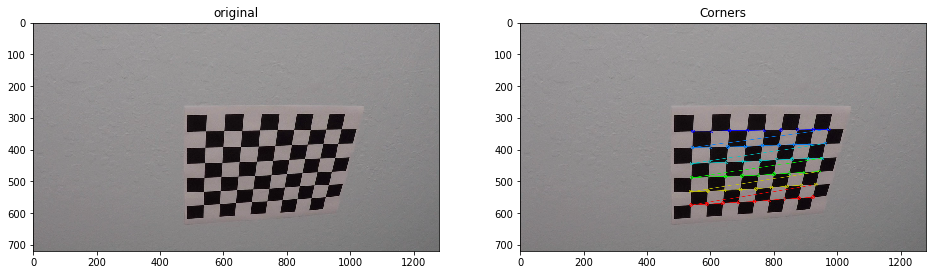

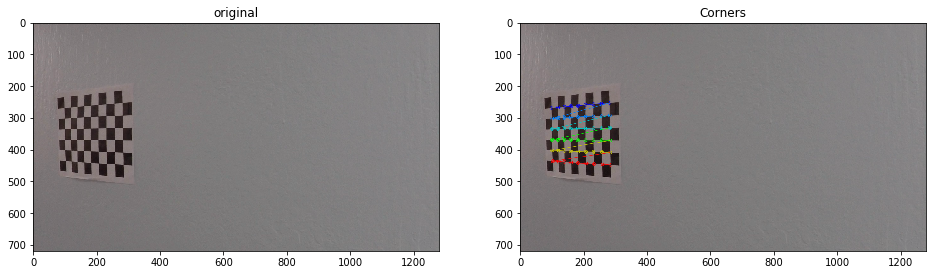

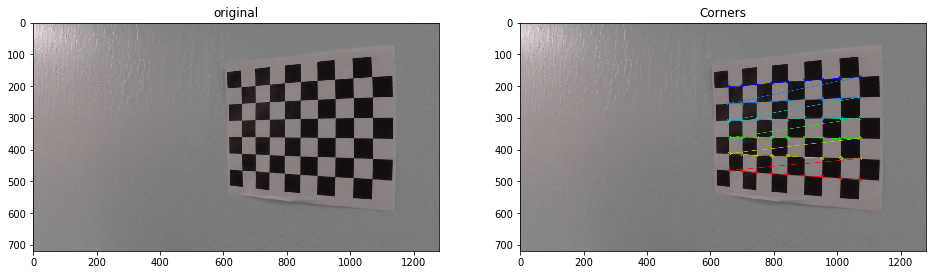

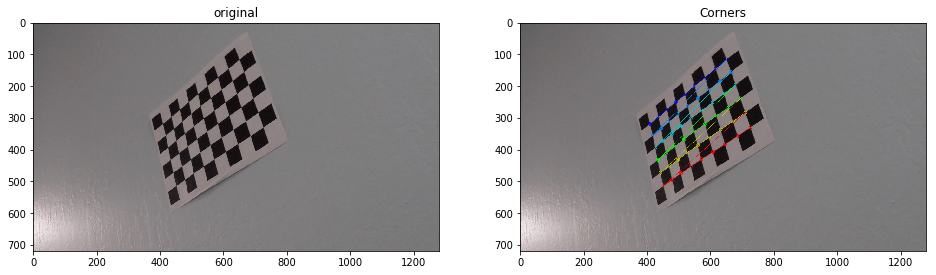

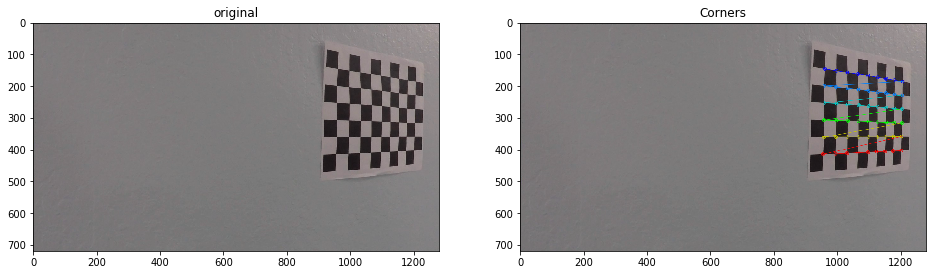

...

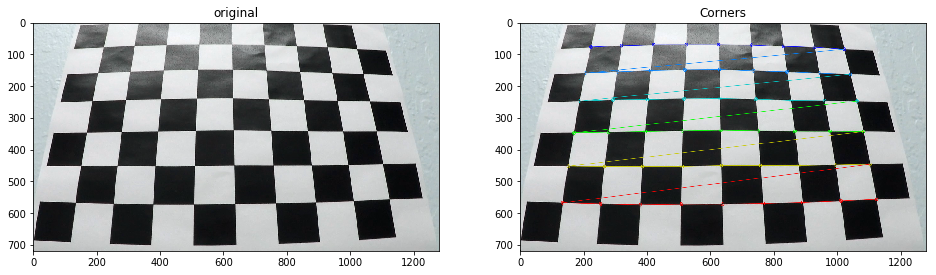

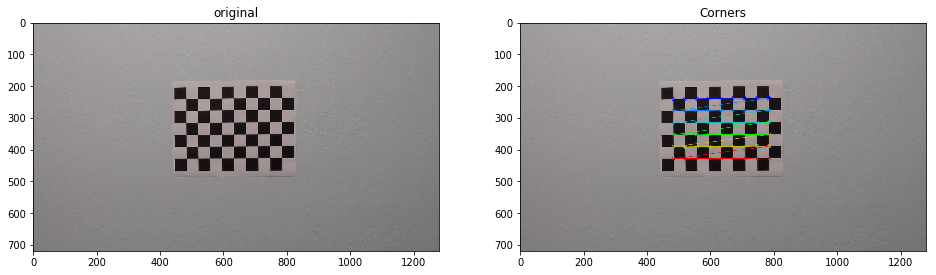

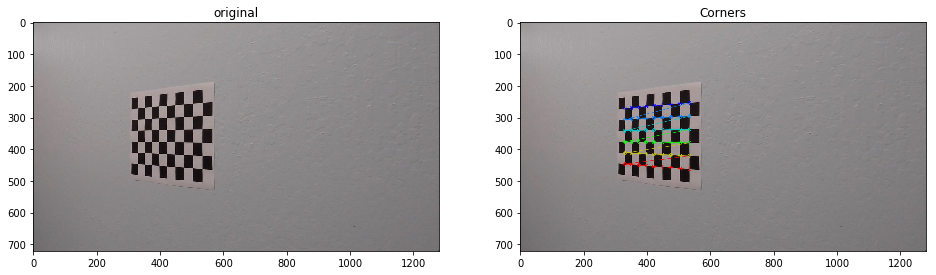

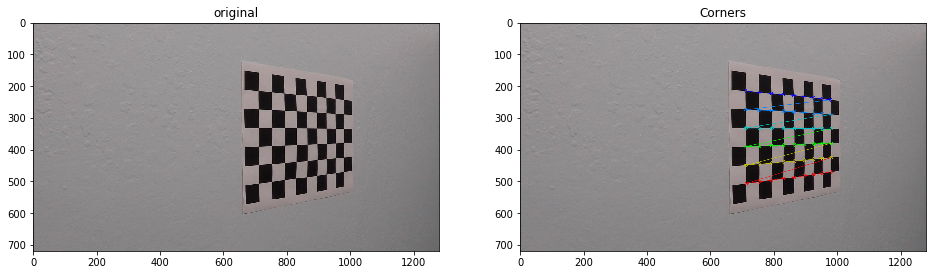

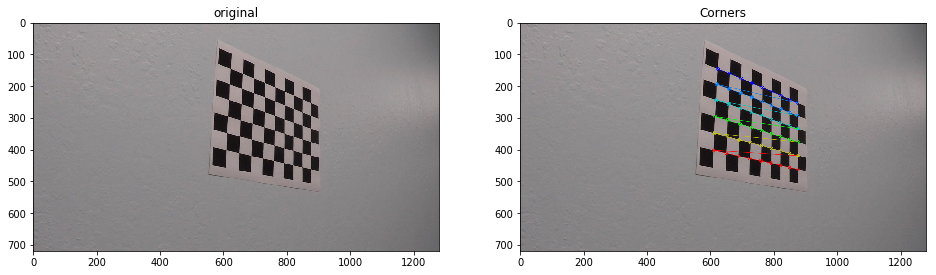

In [9]:
# Calibrate Camera

# Extract Calibration Matrix by passing Chessboard images 
calib_ret, calib_mtx, calib_dist = MyCamera.calibrateByChessboard(images_folder_name="camera_cal/calibration*.jpg",size=(9,6))
print("Calibration-Matrix=", calib_mtx)
print("Calibration-Distortion-Coefficents=", calib_dist)

### Undistort Images

Now, I have calculated the Calibration-Matrix and Distortion Coefficients. <br>
I will apply undistortion Image to a Test-Image

Text(0.5, 1.0, 'Undistorted Image')

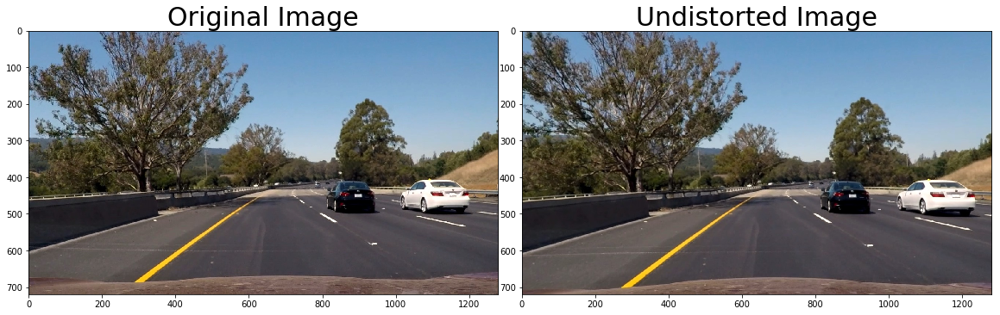

In [5]:
img = mpimg.imread('test_images/test6.jpg')
# undistort images
undist_img = MyCamera.undistort(img)
MyImage = Image(undist_img, interact_plot=False, show_plot=False)

# Visualize unwarp
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.05)
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(undist_img)
ax2.set_title('Undistorted Image', fontsize=30)

## Test Filters-Thresholds

Test Filtering on Test images: 
By using the Interactive-Plot - Best Threshold values has been choosed for the following Filters:

* Soebl-x Filter Thresholds - $$[30,100]$$
* Magnitude of the Gradients Thresholds - $$[50,200]$$
* White-Mask - $$[200,250]$$
* HLS- S-Channel Threshold - $$[175,255]$$
* RGB -R-Channel Threshold - $$[200,255]$$

These best-values has been applied in `Image::process_image`

In [6]:
img = mpimg.imread('test_images/test5.jpg')
MyImage = Image(img, interact_plot=True, show_plot=False)

In [ ]:
interactive_plot = interactive(MyImage.abs_sobel_thresh, sobel_kernel=(1, 9,2), thresh_min=(0, 255, 10), thresh_max=(0, 255, 10))
output = interactive_plot.children[-1]
output.layout.height = '500px'
interactive_plot

In [ ]:
#mag_binary   = MyImage.mag_thresh(sobel_kernel=9, m_thresh_min=30, m_thresh_max = 100)
interactive_plot = interactive(MyImage.mag_thresh, sobel_kernel=(1, 9,2), m_thresh_min=(0, 255, 10), m_thresh_max=(0, 255, 10))
output = interactive_plot.children[-1]
output.layout.height = '500px'
interactive_plot

In [ ]:
#white_binary =  MyImage.white_thresh(w_thresh_min= 200, w_thresh_max=250)
interactive_plot = interactive(MyImage.white_thresh, w_thresh_min=(0, 255, 10), w_thresh_max=(0, 255, 10))
output = interactive_plot.children[-1]
output.layout.height = '500px'
interactive_plot

In [ ]:
#hls_binary = MyImage.hls_threshold(s_thresh_min=170, s_thresh_max=255)
interactive_plot = interactive(MyImage.hls_threshold, s_thresh_min=(0, 255, 10), s_thresh_max=(0, 255, 10))
output = interactive_plot.children[-1]
output.layout.height = '500px'
interactive_plot

In [ ]:
#rgb_binary = MyImage.rgb_threshold(r_thresh_min=200, r_thresh_max=255)
interactive_plot = interactive(MyImage.rgb_threshold, r_thresh_min=(0, 255, 10), r_thresh_max=(0, 255, 10))
output = interactive_plot.children[-1]
output.layout.height = '500px'
interactive_plot

### Show Combined-Threshold

Text(0.5, 1.0, 'Filtered Image')

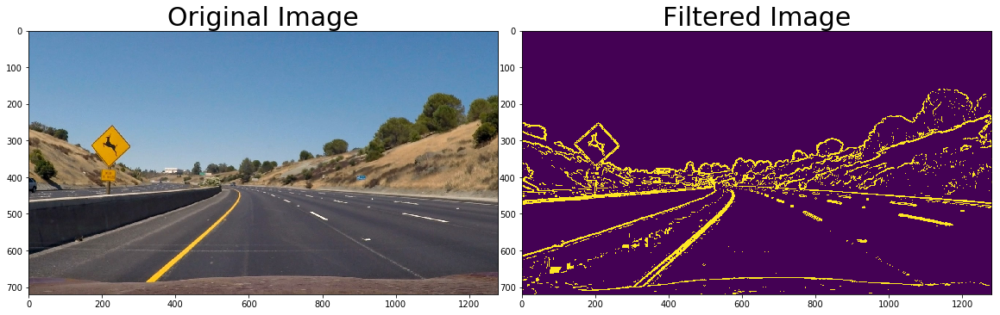

In [7]:
img = mpimg.imread('test_images/test2.jpg')
# undistort images
undist_img = MyCamera.undistort(img)
MyImage = Image(undist_img, interact_plot=False, show_plot=False)

# Apply Thresholds
gradx = MyImage.abs_sobel_thresh(sobel_kernel= 3, thresh_min=30, thresh_max=100)
mag_binary  = MyImage.mag_thresh(sobel_kernel=9, m_thresh_min=50, m_thresh_max = 200)
white_binary =  MyImage.white_thresh(w_thresh_min= 200, w_thresh_max=250)
hls_binary = MyImage.hls_threshold(s_thresh_min=175, s_thresh_max=255)
rgb_binary = MyImage.rgb_threshold(r_thresh_min=200, r_thresh_max=255)

combined = np.zeros_like(gradx)
combined[((gradx == 1) | (mag_binary == 1)) | ( (white_binary == 1)  | (hls_binary == 1) )] = 1

# Visualize unwarp
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.05)
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(combined)
ax2.set_title('Filtered Image', fontsize=30)

## Test perspective transform

`straight_lines1.jpg` was used to extract source and distination points that to be used in Warping Images.<br>
The Coordinates are saved in `Image::calc_warp_points`

Text(0.5, 1.0, 'Warped Image')

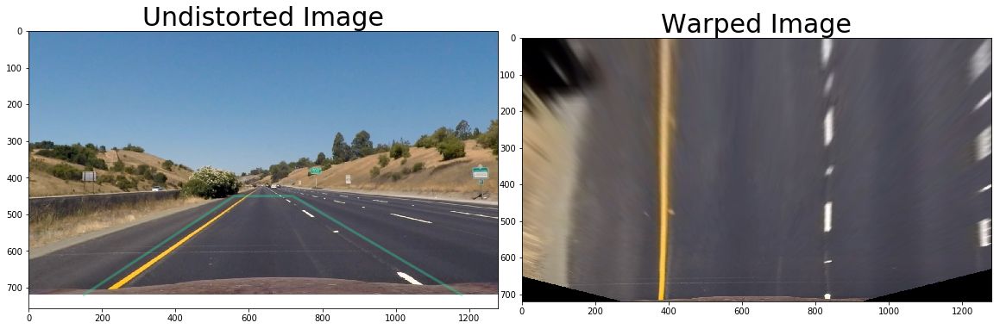

In [8]:
img = mpimg.imread('test_images/straight_lines1.jpg')
# undistort images
undist_img = MyCamera.undistort(img)
MyImage = Image(undist_img, interact_plot=False, show_plot=False)

# let us assume that vertices represent rectangle in real-world
src = np.float32([[150, 720],[560, 450] ,[720, 450] , [1180, 720]])
dst = np.float32([[350, 720],[210, 0], [1010, 0], [870,720]])

#src, dst = MyImage.calc_warp_points()
warp_img, M, M_Inv = MyImage.warp(undist_img, src,dst)

# Visualize unwarp
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.05)
ax1.imshow(undist_img)
x = [src[0][0], src[1][0], src[2][0], src[3][0]]
y = [src[0][1], src[1][1], src[2][1], src[3][1]]
ax1.plot(x, y, color='#33cc99', alpha=0.4, linewidth=3, solid_capstyle='round', zorder=2)
#ax1.set_ylim([h,0])
#ax1.set_xlim([0,w])
ax1.set_title('Undistorted Image', fontsize=30)
ax2.imshow(warp_img)
ax2.set_title('Warped Image', fontsize=30)

## Test Lane Lines Fitting

1. Search Windows will be applied to the Warped Image using convolution Mask. By applying a window template across the image from left to right and creating a convolved signal. The peak of the convolved signal is where highest overlap of pixels, which indicates the position for the lane marker.
2. Apply 2nd Polynomial Fitting to the found `l_points` and `r_points`

Text(0.5, 1.0, 'Window Search and Polynomial Fitting')

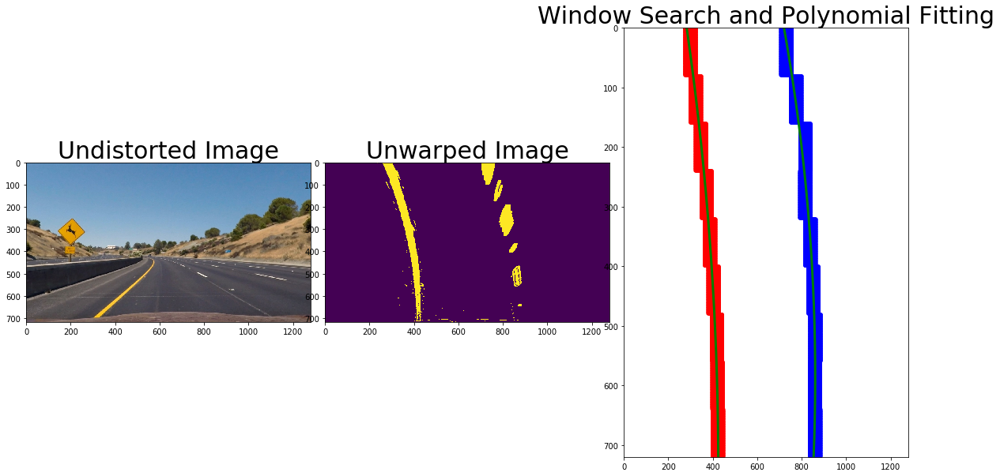

In [9]:
# apply Search-Window
img = mpimg.imread('test_images/test2.jpg')
# undistort images
undist_img = MyCamera.undistort(img)
MyImage = Image(undist_img, interact_plot=False, show_plot=False)
# extract ROI/ WARP
roi_img, warp_img, M, M_Inv = MyImage.process_image()
    
MySearchWindow = search_window(warp_img, window_width=10, window_height=60, margin=10)
# find window-centroids
output_img, l_points, r_points = MySearchWindow.find_line_points()

leftx =  l_points.nonzero()[1]
lefty =  l_points.nonzero()[0]
rightx = r_points.nonzero()[1]
righty = r_points.nonzero()[0]

# Extract left and right line pixel positions
ploty = np.linspace(0, 719, num=720)# to cover same y-range as image

# Fit a second order polynomial to pixel positions in each fake lane line
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)

left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    
# Visualize unwarp
f, (ax1, ax2,ax3) = plt.subplots(1, 3, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.05)
ax1.imshow(undist_img)
ax1.set_title('Undistorted Image', fontsize=30)
ax2.imshow(warp_img)
ax2.set_title('Unwarped Image', fontsize=30)

# Plot up the fitting data
mark_size = 3
ax3.plot(leftx, lefty, 'o', color='red', markersize=mark_size)
ax3.plot(rightx, righty, 'o', color='blue', markersize=mark_size)
ax3.plot(left_fitx, ploty, color='green', linewidth=3)
ax3.plot(right_fitx, ploty, color='green', linewidth=3)
ax3.set_xlim(0, 1280)
ax3.set_ylim(0, 720)
ax3.invert_yaxis() # to visualize as we do the images
ax3.set_title('Window Search and Polynomial Fitting', fontsize=30)

---
## Test Images

We can put all the algorithms together in `lane_detect_pipeline` and test the images located in `test_images`.<br>
Images will saved in `output_images` folder.<br><br><br>
Road-Curvature has been calculated based on the [Formula](https://www.intmath.com/applications-differentiation/8-radius-curvature.php) <br><br>

Center-Offset is calculated using:<br>
    $ CenterOffset = (ImageCenter - LaneCenterPosition) * XmPerPix $
<br>**Where:**<br>
    $ XmPerPix=3.7/700$<br>
    $ LaneCenterPosition = (Right(y_max) + Left(y_max))/2 $

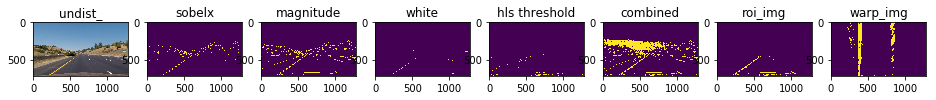

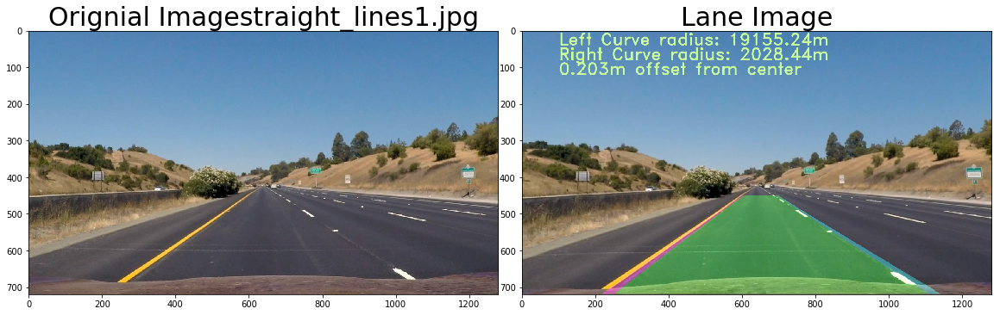

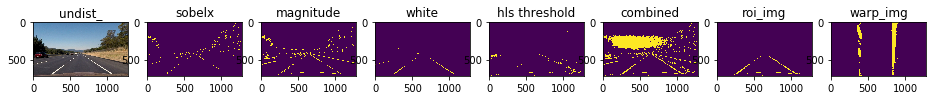

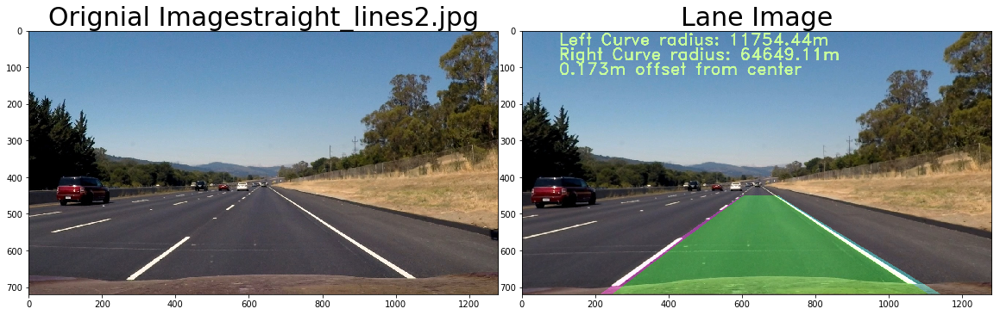

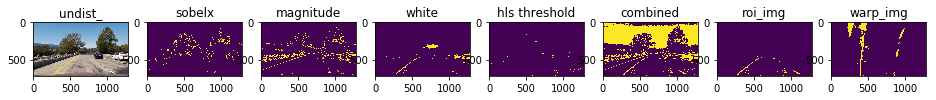

...

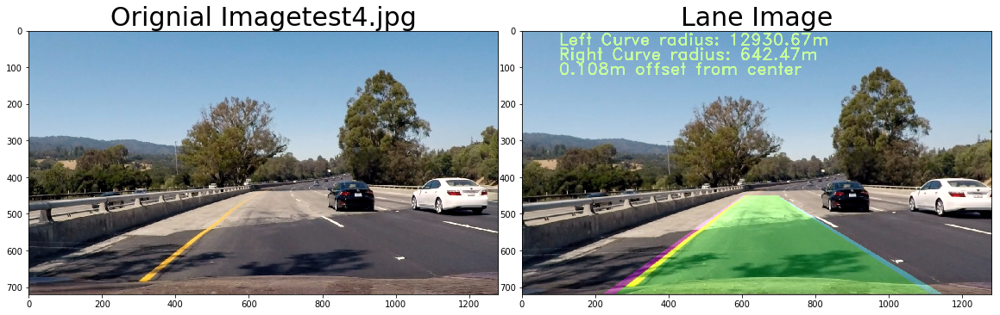

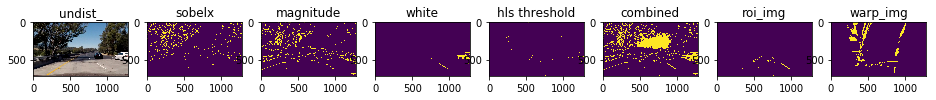

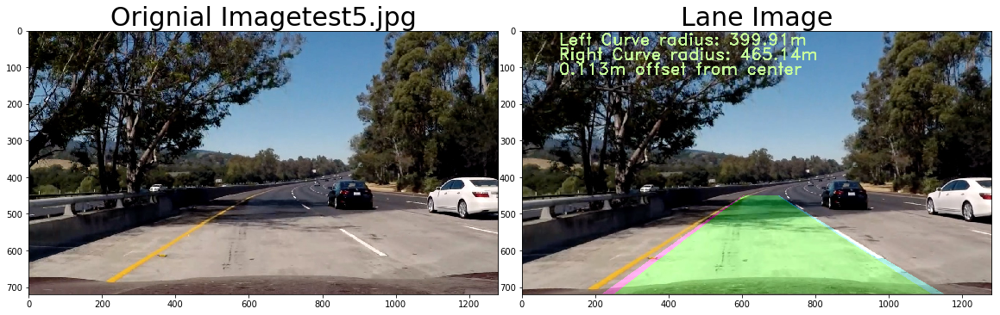

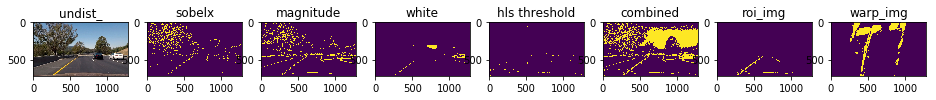

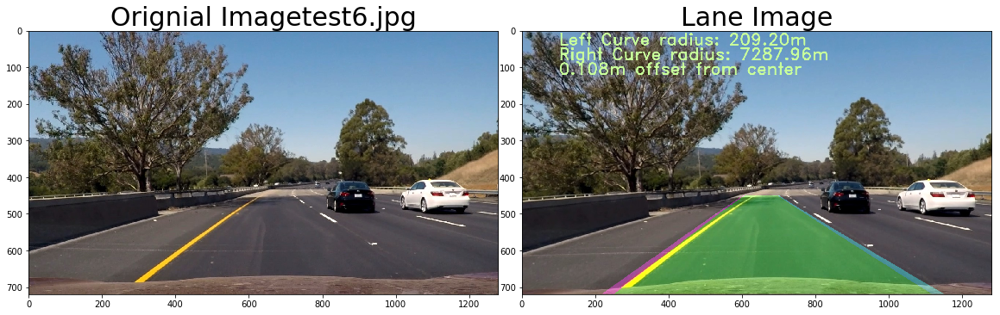

In [11]:
# Loop to all Images in Test-Images Folder
for img_name in os.listdir("test_images/"):
    # extract frame-image
    img = mpimg.imread('test_images/'+ img_name)
    
    # undistort images
    undist_img = MyCamera.undistort(img)
    
    # apply Lane-Detection Pipeline
    un_warp_img = lane_detect_pipeline(img, show_plot=True)
    
    mpimg.imsave("output_images/annotated_"+img_name, un_warp_img)

    # Visualize unwarp
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    f.subplots_adjust(hspace = .2, wspace=.05)
    ax1.imshow(img)
    ax1.set_title('Orignial Image' + img_name, fontsize=30)
    ax2.imshow(un_warp_img)
    ax2.set_title('Lane Image', fontsize=30)


---
## Test on Videos

You know what's cooler than drawing lanes over images? Drawing lanes over video!

We can test our solution on two provided videos:

`project_video.mp4`
`challenge_video.mp4`
`harder_challenge_video.mp4`


### 1.project_video.mp4

In [12]:
output_clip1_path = 'test_videos_output/project_video.mp4'
output_clip2_path = 'test_videos_output/challenge_video.mp4'
output_clip3_path = 'test_videos_output/harder_challenge_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("project_video.mp4")
clip2 = VideoFileClip("challenge_video.mp4")
clip3 = VideoFileClip("harder_challenge_video.mp4")
output_clip1 = clip1.fl_image(lane_detect_pipeline) #NOTE: this function expects color images!!
output_clip2 = clip2.fl_image(lane_detect_pipeline)
output_clip3 = clip3.fl_image(lane_detect_pipeline)

%time output_clip1.write_videofile(output_clip1_path, audio=False)
#%time output_clip2.write_videofile(output_clip2_path, audio=False)
#%time output_clip3.write_videofile(output_clip3_path, audio=False)

[MoviePy] >>>> Building video test_videos_output/project_video.mp4
[MoviePy] Writing video test_videos_output/project_video.mp4


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [04:12<00:00,  5.31it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/project_video.mp4 

Wall time: 4min 13s


In [13]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output_clip1_path))

## Reflection

### Justification:
- The current pipeline worked well on gray-scale images; thus i avoided using HSV/HSL images to extract the yellow lanes - i found it very error-prone based on the selected ranges.
- The current pipeline kept the algorithms simple and straightforward to meet the Project submission dead-line

### Shortcomings would be:
- Window Searching consumed alot of time
- Using different Filters with so many threshold-values, made it difficult to extract Lane-Lines
- Shadows on the Road/Lighthing-conditions, or damaged/missing lane-lines affected the processing of lane-lines 
- Using Buffers/ Average to stabilize results, did not work in many frames, where the lines were damaged, which led to totally missleading lane-lines
- Stabilizing Lane-Lines would help maintaing the lane-lines, if the Images could not contain any lines
- Road Radius varies signicantly between Left/Right Lane Lines - due to fitting problems


### Suggest possible improvements to your pipeline

Possible improvements would be:
- Use Lane-Model (4-Points Polly-Model) and try to fit it on the road - with this approach the Lane-Lines will be
Use Tracking to stabilize Lane-Line recognition

More description are also provided in the writeup `writeup.md` saved in the workspace

